<a href="https://colab.research.google.com/github/peguescj/data-management/blob/main/PS6%20Draft.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

can do more descriptive stats like the other 2 guys

https://github.com/worldterminator/worldterminator/blob/main/ps5%266%20Yachun.ipynb


https://github.com/citjimm/DMDS/blob/main/PS6-Cit.ipynb



# PS5

##Tool Uploading

Going with a full fresh slate for PS5, to clean up allof my prior documentation and stave off file bloat.

Thoughts, notes, and sources: https://docs.google.com/document/d/1GSLGDtX9xJvlm0Vxj_0sWzanx0HhvD5iqQ0e8M9871g/edit?usp=sharing

In [1]:
!pip install ydata-profiling
from ydata_profiling import ProfileReport

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.6/357.6 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.9/381.9 kB 32.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 16.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 39.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 30.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 45.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 30.8 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=c2887a21de952926dcfd85e381d79d7a6528aaca289a0302e5589669276c555b
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0
 

In [2]:
#---------------------------SETUP----------------------------------
#get useful libraries
import time, os, sys, re #basics
import zipfile, json, datetime, string   #string for annotating points in scatter
import numpy as np #basic math
from statistics import * #stats

import matplotlib.pyplot as plt #import pylab as plt #apparently discouraged now:
 #https://stackoverflow.com/questions/11469336/what-is-the-difference-between-pylab-and-pyplot
 #https://www.tutorialspoint.com/matplotlib/matplotlib_pylab_module.htm

import pandas as pd
import pandas_datareader as pdr
from pandas_datareader import wb
from pandas.io.formats.style import Styler
#s4 = Styler(df4, uuid_len=0, cell_ids=False)

import urllib  #weird, guess need to have os and pandas imported for this to work  %TODO/LATER ditch it, its weird anyway, just use wget/curl

from google.colab import files

#import webbrowser

import seaborn as sns

from google.colab import data_table
data_table.enable_dataframe_formatter() #this enables spreadsheet view upon calling dataframe (without() )

#many tricks how to extend notebook functionality
#https://coderzcolumn.com/tutorials/python/list-of-useful-magic-commands-in-jupyter-notebook-lab
#will display all output not just last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

#MAGICS and THEMES/STYLES: important! does affect not just shading/colors, but also fonts, spacing, etc
#(even if you only select default (v not selecting anything) [but does seem to work better if you do make explicit sleections])

###magics: https://ipython.readthedocs.io/en/stable/interactive/magics.html
#most essential setup for vis: it does affect vis! careful!! stick with inline, maybe notebook; others mostly for non-notebook, eg spyder environ
#https://jakevdp.github.io/PythonDataScienceHandbook/04.00-introduction-to-matplotlib.html recomends *inline*!
#show current one:
#%matplotlib
#%matplotlib --list
#interactive plots:
#%matplotlib notebook
#static images of your plot:
%matplotlib inline
#may play with this one and other magics (btw default is probably agg)
#%matplotlib nbagg

###themes/styles: https://matplotlib.org/stable/gallery/style_sheets/style_sheets_reference.html
#https://jakevdp.github.io/PythonDataScienceHandbook/04.11-settings-and-stylesheets.html
#https://matplotlib.org/stable/tutorials/introductory/customizing.html
#here more about art and style than under the hood functionality as with magics, explore and experiment
#many may find 'default' or seaborn ones more pleasing; my fav 'classic' is back from 90s ;)
#plt.style.available #list available styles :) may install more
#plt.style.use('default') # more delicate subtle than classic
plt.style.use('classic')  #  'seaborn-whitegrid' 'seaborn-white' 'seaborn-poster'
# btw: magics v theme/style sequence matters, eg if i specify classic style before inline magic, i wouldnt get grey bounding box im getting

In [3]:
# basic navigation
#wd =  'CountyRates.xlsx'  #'C:\Users\ref\Desktop\junk' # may need to ADJUST
#os.makedirs(wd)
#os.getcwd() #pwd
!pwd
#os.listdir() #compare to clicking on the left the folder icon #dir
!ls
#os.chdir(wd)
#os.getcwd()

/content
sample_data


## Data Uploading (County)

In [4]:
#Let's start by uploading our major 5 merged datasets.

In [5]:
#DOE doesn't have the data at County level. Found a database that drew from the DOE sample to present Grad Rates at the county level.
#urllib.request.urlretrieve("https://docs.google.com/uc?id=107VTwNv2HyDMnZk41-h0yD-5T4Nv8v2Z&export=download ", "CountyRates.xlsx")
!wget -q -O CountyRates.xlsx https://docs.google.com/uc?id=107VTwNv2HyDMnZk41-h0yD-5T4Nv8v2Z&export=download

In [6]:
dat=pd.read_excel('CountyRates.xlsx', sheet_name='Additional Measure Data',skiprows=[0,2])
#Skipping a junk row and the state level data row.

In [7]:
CountyGrad=dat[['County','High School Graduation Rate']]

In [8]:
CountyGrad

,County,High School Graduation Rate
0,Atlantic,90.094340
1,Bergen,95.283082
2,Burlington,95.197921
3,Camden,88.195373
4,Cape May,91.222959
5,Cumberland,86.446719
6,Essex,88.256066
7,Gloucester,92.791424
8,Hudson,84.982456
9,Hunterdon,95.920667


In [9]:
#Here's the causes of death in NJ with rates by county.
#urllib.request.urlretrieve("https://docs.google.com/uc?id=1GWBGqsePB4fu1PJ5dwGJonafQc43gDp8&export=download", "Death.xlsx")
!wget -q -O Death.xlsx https://docs.google.com/uc?id=1GWBGqsePB4fu1PJ5dwGJonafQc43gDp8&export=download

In [10]:
dat=pd.read_excel('Death.xlsx',skiprows=[0,1,2,3,4,5,6], nrows=21)

In [11]:
#Let's slim this down to just some of the more basic variables - COVID, and Diseases of the Heart seem like they'd have things that could be compared to some of the food data we'll be looking at.
DeathCounty=dat[['Unnamed: 0','COVID-19 (U07.1)','Diseases of heart (I00-I09,I11,I13,I20-I51)']]

In [12]:
DeathCounty.rename(columns={'Unnamed: 0':'County'},inplace=True)

<ipython-input-12-55c78103f17d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  DeathCounty.rename(columns={'Unnamed: 0':'County'},inplace=True)


In [13]:
DeathCounty=DeathCounty.replace(to_replace="**", value="NaN")
#Standarizing the missing variable across all datasets.

In [14]:
DeathCounty

,County,COVID-19 (U07.1),"Diseases of heart (I00-I09,I11,I13,I20-I51)"
0,Atlantic,42,384
1,Hunterdon,NaN,141
2,Mercer,34,442
3,Middlesex,86,909
4,Monmouth,74,863
5,Morris,53,561
6,Ocean,58,1343
7,Passaic,44,499
8,Salem,NaN,102
9,Somerset,35,351


In [15]:
#Rates of Food Insecurity in NJ by County
#urllib.request.urlretrieve("https://docs.google.com/uc?id=1vJIna5IDtbaLUKpXiGKfd6u9FHU8_BZI&export=download ", "FoodInsec.xlsx")
!wget -q -O FoodInsec.xlsx https://docs.google.com/uc?id=1vJIna5IDtbaLUKpXiGKfd6u9FHU8_BZI&export=download

In [16]:
dat=pd.read_excel('FoodInsec.xlsx',
                   sheet_name='County',
                   header=0,
                   skiprows=lambda a: (a > 0 and (a < 1776 or a > 1796)) )
#This sheet has all of the counties in the US in one big chain. I had a tutor show me how to make a lambda function to pull out only the NJ counties.

In [17]:
FoodInsecClean=dat[['County, State','Overall Food Insecurity Rate', '# of Food Insecure Persons Overall',
       'Food Insecurity Rate among Black Persons (all ethnicities)',
       'Food Insecurity Rate among Hispanic Persons (any race)',
       'Food Insecurity Rate among White, non-Hispanic Persons ', '# of Food Insecure Children']]
       #Preserving just the most interesting variables.

In [18]:
#Now there's only one issue - the 'County, New Jersey' tagged onto the end of each of these will make it so they don't merge
FoodInsec = FoodInsecClean.replace(to_replace=" County, New Jersey", value="", regex=True)
#This should chop just that part off and leave us with a mergable variable.

In [19]:
FoodInsec

,"County, State",Overall Food Insecurity Rate,# of Food Insecure Persons Overall,Food Insecurity Rate among Black Persons (all ethnicities),Food Insecurity Rate among Hispanic Persons (any race),"Food Insecurity Rate among White, non-Hispanic Persons",# of Food Insecure Children
0,Atlantic,0.112,30810,0.20,0.19,0.06,8800
1,Bergen,0.067,64240,0.11,0.12,0.03,7370
2,Burlington,0.056,25920,0.09,0.13,0.03,6410
3,Camden,0.091,47500,0.16,0.19,0.05,14720
4,Cape May,0.099,9450,0.20,0.16,0.06,1870
5,Cumberland,0.104,16080,0.22,0.17,0.06,6020
6,Essex,0.099,84450,0.21,0.17,0.04,34710
7,Gloucester,0.066,19880,0.14,0.14,0.03,3900
8,Hudson,0.110,78150,0.19,0.16,0.07,19000
9,Hunterdon,0.046,5910,0.08,0.09,0.01,0


In [20]:
FoodInsec.rename(columns={'County, State':'County'},inplace=True)
#Changing the column name for merging.

In [21]:
#Loading in the Census Race data for comparison's to the death by race data, as well as the administrative data later on in the second dataset.
#urllib.request.urlretrieve("https://docs.google.com/uc?id=1_QQGO7UjmWJUp8m-CieMkLe4G1cYK4mI&export=download ", "Census.csv")
!wget -q -O Census.csv https://docs.google.com/uc?id=1_QQGO7UjmWJUp8m-CieMkLe4G1cYK4mI&export=download

In [22]:
dat=pd.read_csv('Census.csv',skiprows=1)

In [23]:
CensusWhiteBlackUncut=dat[['Geographic Area Name',' !!Total:!!Population of one race:!!White alone',' !!Total:!!Population of one race:!!Black or African American alone']]

In [24]:
CensusWhiteBlackUncut
#Same issue with Foodinsec. Luckily, we have the exact code written out already!

,Geographic Area Name,!!Total:!!Population of one race:!!White alone,!!Total:!!Population of one race:!!Black or African American alone
0,"Atlantic County, New Jersey",156796,41519
1,"Bergen County, New Jersey",543849,54831
2,"Burlington County, New Jersey",303024,77749
3,"Camden County, New Jersey",293198,101109
4,"Cape May County, New Jersey",81536,3567
5,"Cumberland County, New Jersey",74606,28581
6,"Essex County, New Jersey",261487,335047
7,"Gloucester County, New Jersey",230313,32992
8,"Hudson County, New Jersey",248561,79498
9,"Hunterdon County, New Jersey",106790,3174


In [25]:
CensusWhiteBlack = CensusWhiteBlackUncut.replace(to_replace=" County, New Jersey", value="", regex=True)

In [26]:
CensusWhiteBlack.rename(columns={'Geographic Area Name':'County'},inplace=True)
#Changing the column name for merging.

In [27]:
#REMOVED - ASK QUESTIONS IN CLASS!
#https://www.nj.com/data/2018/05/the_greenest_town_in_each_of_new_jerseys_21_counti.html
#I previously was using a dataset from the US agricultural department as a fascimile of greenspaces in NJ, but was not totally satisfied with the parallel to it. I found what looks like some really interesting GIS data
#as well as it in non GIS form, but I can't find the source for it in any way I can tackle on python properly. If anyone has any ideas of where I could find a breakdown like this better, I'd appreciate it!

In [28]:
#Until I get the above sorted out, and/or figure out how to get the DOA's data tool to work the way I'd like it to, here's the old hogs dataset.
#Ideally, this would just be the totals of all livestock(Cow, Sheep, Pig, Goat, Alpaca), but the "Totals" format the DOA provides is purely by dollars earned, not count
#Despite having each count manually in the dataset. I could pull them all in sperately, and use a function to add the totals together to make a new dataset
#But in an ideal circumstance, I'd just be using the above greenspace data.
#Some basic agricultural data - filtered down to just pigs. In future, will do multiple merges to pull in all livestock data into one databank
#The state's website limits it to only a certain number of entries per pull, so I'll have to stitch them together to get the numbers I want
#It notably doesn't include every County in the state, so we'll be missing a few later on - specificially Bergen, Hudson, and Union.
#urllib.request.urlretrieve("https://docs.google.com/uc?id=1HC2Z7yNDjQ8x8Bbk6BXMGiwzVlmD0sDX&export=download ", "Hogs.csv")
!wget -q -O Hogs.csv https://docs.google.com/uc?id=1HC2Z7yNDjQ8x8Bbk6BXMGiwzVlmD0sDX&export=download

In [29]:
dat=pd.read_csv('Hogs.csv')

In [30]:
HogsClean=dat[['Year','County','Value','CV (%)']]

In [31]:
#Restricted down to the useful bits we needed. Now let's narrow it down to one year! If I wanted, I code do this multiple times and then remerge them so their more comparable line wise.
#No ' around 2017 because it's a number.
Hogs2017=HogsClean[dat['Year']==2017]

In [32]:
Hogs2017["County"]=Hogs2017["County"].str.title()
#Fixing a title issue for Merge.

<ipython-input-32-6aa50efd73bd>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Hogs2017["County"]=Hogs2017["County"].str.title()


In [33]:
Hogs2017=Hogs2017.replace(to_replace="\(D\)", value="NaN", regex=True)
#Standarizing the missing variable across all datasets.

In [34]:
Hogs2017

,Year,County,Value,CV (%)
0,2017,Burlington,"2,025",32.3
1,2017,Mercer,NaN,NaN
2,2017,Middlesex,NaN,NaN
3,2017,Monmouth,51,32.3
4,2017,Ocean,314,32.3
5,2017,Essex,3,32.3
6,2017,Hunterdon,761,32.3
7,2017,Morris,165,32.3
8,2017,Passaic,42,32.3
9,2017,Somerset,919,32.3


In [35]:
#Uploading in some housing, election, and commuting data for Central, South, and North jersey.
#urllib.request.urlretrieve("https://docs.google.com/uc?id=1t6lGdflgCdisu5EzohDSMA2GmEx5MlVZ&export=download  ", "SCN.csv")
!wget -q -O SCN.csv https://docs.google.com/uc?id=1t6lGdflgCdisu5EzohDSMA2GmEx5MlVZ&export=download

In [36]:
dat=pd.read_csv('SCN.csv')

In [37]:
SCNCommuteElection=dat

In [38]:
mapping_jersey_SCN = {'Atlantic':'Southern'
                              ,'Cumberland':'Southern'
                              ,'Burlington':'Southern'
                              ,'Gloucester':'Southern'
                              ,'Salem':'Southern'
                              ,'Cape May':'Southern'
                              ,'Atlantic':'Southern'
                              ,'Camden':'Southern'
                              ,'Ocean' : 'Central'
                              ,'Bergen':'Northern'
                              ,'Essex':'Northern'
                              ,'Hudson':'Northern'
                              ,'Morris':'Northern'
                              ,'Passaic':'Northern'
                              ,'Sussex':'Northern'
                              ,'Union':'Northern'
                              ,'Warren':'Northern'
                              ,'Mercer': 'Northern'
                              ,'Monmouth' : 'Central'
                              ,'Middlesex':'Central'
                              ,'Hunterdon':'Central'
                              ,'Somerset':'Central'}

## Merging Data (County)

In [39]:
 GradDeath = pd.merge(CountyGrad, DeathCounty, how='outer', on=['County'], indicator=True)

In [40]:
 GradDeath

,County,High School Graduation Rate,COVID-19 (U07.1),"Diseases of heart (I00-I09,I11,I13,I20-I51)",_merge
0,Atlantic,90.094340,42,384,both
1,Bergen,95.283082,89,980,both
2,Burlington,95.197921,49,619,both
3,Camden,88.195373,39,648,both
4,Cape May,91.222959,NaN,179,both
5,Cumberland,86.446719,12,202,both
6,Essex,88.256066,49,705,both
7,Gloucester,92.791424,24,384,both
8,Hudson,84.982456,38,535,both
9,Hunterdon,95.920667,NaN,141,both


In [41]:
GradDeathClean=GradDeath[['County', 'High School Graduation Rate', 'COVID-19 (U07.1)',
       'Diseases of heart (I00-I09,I11,I13,I20-I51)']]

In [42]:
GradDeathClean

,County,High School Graduation Rate,COVID-19 (U07.1),"Diseases of heart (I00-I09,I11,I13,I20-I51)"
0,Atlantic,90.094340,42,384
1,Bergen,95.283082,89,980
2,Burlington,95.197921,49,619
3,Camden,88.195373,39,648
4,Cape May,91.222959,NaN,179
5,Cumberland,86.446719,12,202
6,Essex,88.256066,49,705
7,Gloucester,92.791424,24,384
8,Hudson,84.982456,38,535
9,Hunterdon,95.920667,NaN,141


In [43]:
 GradDeathFood = pd.merge(GradDeathClean, FoodInsec, how='outer', on=['County'], indicator=True)

In [44]:
 GradDeathFood

,County,High School Graduation Rate,COVID-19 (U07.1),"Diseases of heart (I00-I09,I11,I13,I20-I51)",Overall Food Insecurity Rate,# of Food Insecure Persons Overall,Food Insecurity Rate among Black Persons (all ethnicities),Food Insecurity Rate among Hispanic Persons (any race),"Food Insecurity Rate among White, non-Hispanic Persons",# of Food Insecure Children,_merge
0,Atlantic,90.094340,42,384,0.112,30810,0.20,0.19,0.06,8800,both
1,Bergen,95.283082,89,980,0.067,64240,0.11,0.12,0.03,7370,both
2,Burlington,95.197921,49,619,0.056,25920,0.09,0.13,0.03,6410,both
3,Camden,88.195373,39,648,0.091,47500,0.16,0.19,0.05,14720,both
4,Cape May,91.222959,NaN,179,0.099,9450,0.20,0.16,0.06,1870,both
5,Cumberland,86.446719,12,202,0.104,16080,0.22,0.17,0.06,6020,both
6,Essex,88.256066,49,705,0.099,84450,0.21,0.17,0.04,34710,both
7,Gloucester,92.791424,24,384,0.066,19880,0.14,0.14,0.03,3900,both
8,Hudson,84.982456,38,535,0.110,78150,0.19,0.16,0.07,19000,both
9,Hunterdon,95.920667,NaN,141,0.046,5910,0.08,0.09,0.01,0,both


In [45]:
 GradDeathFoodAgri = pd.merge(GradDeathFood, Hogs2017, how='outer', on=['County'], indicator=False)

In [46]:
 GradDeathFoodAgri

,County,High School Graduation Rate,COVID-19 (U07.1),"Diseases of heart (I00-I09,I11,I13,I20-I51)",Overall Food Insecurity Rate,# of Food Insecure Persons Overall,Food Insecurity Rate among Black Persons (all ethnicities),Food Insecurity Rate among Hispanic Persons (any race),"Food Insecurity Rate among White, non-Hispanic Persons",# of Food Insecure Children,_merge,Year,Value,CV (%)
0,Atlantic,90.094340,42,384,0.112,30810,0.20,0.19,0.06,8800,both,2017.0,NaN,NaN
1,Bergen,95.283082,89,980,0.067,64240,0.11,0.12,0.03,7370,both,NaN,NaN,NaN
2,Burlington,95.197921,49,619,0.056,25920,0.09,0.13,0.03,6410,both,2017.0,"2,025",32.3
3,Camden,88.195373,39,648,0.091,47500,0.16,0.19,0.05,14720,both,2017.0,NaN,NaN
4,Cape May,91.222959,NaN,179,0.099,9450,0.20,0.16,0.06,1870,both,2017.0,665,32.3
5,Cumberland,86.446719,12,202,0.104,16080,0.22,0.17,0.06,6020,both,2017.0,113,32.3
6,Essex,88.256066,49,705,0.099,84450,0.21,0.17,0.04,34710,both,2017.0,3,32.3
7,Gloucester,92.791424,24,384,0.066,19880,0.14,0.14,0.03,3900,both,2017.0,939,32.3
8,Hudson,84.982456,38,535,0.110,78150,0.19,0.16,0.07,19000,both,NaN,NaN,NaN
9,Hunterdon,95.920667,NaN,141,0.046,5910,0.08,0.09,0.01,0,both,2017.0,761,32.3


In [47]:
 GradDeathFoodAgriRace = pd.merge(GradDeathFoodAgri, CensusWhiteBlack, how='outer', on=['County'], indicator=False)

In [48]:
 GradDeathFoodAgriRace

,County,High School Graduation Rate,COVID-19 (U07.1),"Diseases of heart (I00-I09,I11,I13,I20-I51)",Overall Food Insecurity Rate,# of Food Insecure Persons Overall,Food Insecurity Rate among Black Persons (all ethnicities),Food Insecurity Rate among Hispanic Persons (any race),"Food Insecurity Rate among White, non-Hispanic Persons",# of Food Insecure Children,_merge,Year,Value,CV (%),!!Total:!!Population of one race:!!White alone,!!Total:!!Population of one race:!!Black or African American alone
0,Atlantic,90.094340,42,384,0.112,30810,0.20,0.19,0.06,8800,both,2017.0,NaN,NaN,156796,41519
1,Bergen,95.283082,89,980,0.067,64240,0.11,0.12,0.03,7370,both,NaN,NaN,NaN,543849,54831
2,Burlington,95.197921,49,619,0.056,25920,0.09,0.13,0.03,6410,both,2017.0,"2,025",32.3,303024,77749
3,Camden,88.195373,39,648,0.091,47500,0.16,0.19,0.05,14720,both,2017.0,NaN,NaN,293198,101109
4,Cape May,91.222959,NaN,179,0.099,9450,0.20,0.16,0.06,1870,both,2017.0,665,32.3,81536,3567
5,Cumberland,86.446719,12,202,0.104,16080,0.22,0.17,0.06,6020,both,2017.0,113,32.3,74606,28581
6,Essex,88.256066,49,705,0.099,84450,0.21,0.17,0.04,34710,both,2017.0,3,32.3,261487,335047
7,Gloucester,92.791424,24,384,0.066,19880,0.14,0.14,0.03,3900,both,2017.0,939,32.3,230313,32992
8,Hudson,84.982456,38,535,0.110,78150,0.19,0.16,0.07,19000,both,NaN,NaN,NaN,248561,79498
9,Hunterdon,95.920667,NaN,141,0.046,5910,0.08,0.09,0.01,0,both,2017.0,761,32.3,106790,3174


In [49]:
GradDeathFoodAgriRace["SCN"]=GradDeathFoodAgriRace["County"].map(mapping_jersey_SCN)

In [50]:
GradDeathFoodAgriRace
#Mapping on Southern, Northern, and Central as a new attribute using the map I made earlier in the semester.
#I had intended to use the Agricultural data, as it has this attribute built in, but since it's missing counties
#I had to make my own and attach it.

,County,High School Graduation Rate,COVID-19 (U07.1),"Diseases of heart (I00-I09,I11,I13,I20-I51)",Overall Food Insecurity Rate,# of Food Insecure Persons Overall,Food Insecurity Rate among Black Persons (all ethnicities),Food Insecurity Rate among Hispanic Persons (any race),"Food Insecurity Rate among White, non-Hispanic Persons",# of Food Insecure Children,_merge,Year,Value,CV (%),!!Total:!!Population of one race:!!White alone,!!Total:!!Population of one race:!!Black or African American alone,SCN
0,Atlantic,90.094340,42,384,0.112,30810,0.20,0.19,0.06,8800,both,2017.0,NaN,NaN,156796,41519,Southern
1,Bergen,95.283082,89,980,0.067,64240,0.11,0.12,0.03,7370,both,NaN,NaN,NaN,543849,54831,Northern
2,Burlington,95.197921,49,619,0.056,25920,0.09,0.13,0.03,6410,both,2017.0,"2,025",32.3,303024,77749,Southern
3,Camden,88.195373,39,648,0.091,47500,0.16,0.19,0.05,14720,both,2017.0,NaN,NaN,293198,101109,Southern
4,Cape May,91.222959,NaN,179,0.099,9450,0.20,0.16,0.06,1870,both,2017.0,665,32.3,81536,3567,Southern
5,Cumberland,86.446719,12,202,0.104,16080,0.22,0.17,0.06,6020,both,2017.0,113,32.3,74606,28581,Southern
6,Essex,88.256066,49,705,0.099,84450,0.21,0.17,0.04,34710,both,2017.0,3,32.3,261487,335047,Northern
7,Gloucester,92.791424,24,384,0.066,19880,0.14,0.14,0.03,3900,both,2017.0,939,32.3,230313,32992,Southern
8,Hudson,84.982456,38,535,0.110,78150,0.19,0.16,0.07,19000,both,NaN,NaN,NaN,248561,79498,Northern
9,Hunterdon,95.920667,NaN,141,0.046,5910,0.08,0.09,0.01,0,both,2017.0,761,32.3,106790,3174,Central


In [51]:
GradDeathFoodAgriRace

,County,High School Graduation Rate,COVID-19 (U07.1),"Diseases of heart (I00-I09,I11,I13,I20-I51)",Overall Food Insecurity Rate,# of Food Insecure Persons Overall,Food Insecurity Rate among Black Persons (all ethnicities),Food Insecurity Rate among Hispanic Persons (any race),"Food Insecurity Rate among White, non-Hispanic Persons",# of Food Insecure Children,_merge,Year,Value,CV (%),!!Total:!!Population of one race:!!White alone,!!Total:!!Population of one race:!!Black or African American alone,SCN
0,Atlantic,90.094340,42,384,0.112,30810,0.20,0.19,0.06,8800,both,2017.0,NaN,NaN,156796,41519,Southern
1,Bergen,95.283082,89,980,0.067,64240,0.11,0.12,0.03,7370,both,NaN,NaN,NaN,543849,54831,Northern
2,Burlington,95.197921,49,619,0.056,25920,0.09,0.13,0.03,6410,both,2017.0,"2,025",32.3,303024,77749,Southern
3,Camden,88.195373,39,648,0.091,47500,0.16,0.19,0.05,14720,both,2017.0,NaN,NaN,293198,101109,Southern
4,Cape May,91.222959,NaN,179,0.099,9450,0.20,0.16,0.06,1870,both,2017.0,665,32.3,81536,3567,Southern
5,Cumberland,86.446719,12,202,0.104,16080,0.22,0.17,0.06,6020,both,2017.0,113,32.3,74606,28581,Southern
6,Essex,88.256066,49,705,0.099,84450,0.21,0.17,0.04,34710,both,2017.0,3,32.3,261487,335047,Northern
7,Gloucester,92.791424,24,384,0.066,19880,0.14,0.14,0.03,3900,both,2017.0,939,32.3,230313,32992,Southern
8,Hudson,84.982456,38,535,0.110,78150,0.19,0.16,0.07,19000,both,NaN,NaN,NaN,248561,79498,Northern
9,Hunterdon,95.920667,NaN,141,0.046,5910,0.08,0.09,0.01,0,both,2017.0,761,32.3,106790,3174,Central


In [52]:
SCN5Merge=pd.merge(GradDeathFoodAgriRace,SCNCommuteElection, how="outer", left_on="SCN", right_on="Section",validate="m:1")

In [53]:
SCN5Merge

,County,High School Graduation Rate,COVID-19 (U07.1),"Diseases of heart (I00-I09,I11,I13,I20-I51)",Overall Food Insecurity Rate,# of Food Insecure Persons Overall,Food Insecurity Rate among Black Persons (all ethnicities),Food Insecurity Rate among Hispanic Persons (any race),"Food Insecurity Rate among White, non-Hispanic Persons",# of Food Insecure Children,...,!!Total:!!Population of one race:!!White alone,!!Total:!!Population of one race:!!Black or African American alone,SCN,Section,Population (2013),Total Area (Sq. mi),Ave. Commute (Min),Ave. Property Taxes,Ave. Property Value,% Votes for Christie (2013)
0,Atlantic,90.094340,42,384,0.112,30810,0.20,0.19,0.06,8800,...,156796,41519,Southern,Southern,1922937,3355.68,26.73,5757,253866,63
1,Burlington,95.197921,49,619,0.056,25920,0.09,0.13,0.03,6410,...,303024,77749,Southern,Southern,1922937,3355.68,26.73,5757,253866,63
2,Camden,88.195373,39,648,0.091,47500,0.16,0.19,0.05,14720,...,293198,101109,Southern,Southern,1922937,3355.68,26.73,5757,253866,63
3,Cape May,91.222959,NaN,179,0.099,9450,0.20,0.16,0.06,1870,...,81536,3567,Southern,Southern,1922937,3355.68,26.73,5757,253866,63
4,Cumberland,86.446719,12,202,0.104,16080,0.22,0.17,0.06,6020,...,74606,28581,Southern,Southern,1922937,3355.68,26.73,5757,253866,63
5,Gloucester,92.791424,24,384,0.066,19880,0.14,0.14,0.03,3900,...,230313,32992,Southern,Southern,1922937,3355.68,26.73,5757,253866,63
6,Salem,95.798969,NaN,102,0.100,6480,0.21,0.21,0.06,2010,...,46600,9534,Southern,Southern,1922937,3355.68,26.73,5757,253866,63
7,Bergen,95.283082,89,980,0.067,64240,0.11,0.12,0.03,7370,...,543849,54831,Northern,Northern,3866532,2274.79,31.73,9737,393672,57
8,Essex,88.256066,49,705,0.099,84450,0.21,0.17,0.04,34710,...,261487,335047,Northern,Northern,3866532,2274.79,31.73,9737,393672,57
9,Hudson,84.982456,38,535,0.110,78150,0.19,0.16,0.07,19000,...,248561,79498,Northern,Northern,3866532,2274.79,31.73,9737,393672,57


In [54]:
SCN5Merge.columns

Index(['County', 'High School Graduation Rate', 'COVID-19 (U07.1)',
       'Diseases of heart (I00-I09,I11,I13,I20-I51)',
       'Overall Food Insecurity Rate', '# of Food Insecure Persons Overall',
       'Food Insecurity Rate among Black Persons (all ethnicities)',
       'Food Insecurity Rate among Hispanic Persons (any race)',
       'Food Insecurity Rate among White, non-Hispanic Persons ',
       '# of Food Insecure Children', '_merge', 'Year', 'Value', 'CV (%)',
       ' !!Total:!!Population of one race:!!White alone',
       ' !!Total:!!Population of one race:!!Black or African American alone',
       'SCN', 'Section', 'Population (2013)', 'Total Area (Sq. mi)',
       'Ave. Commute (Min)', 'Ave. Property Taxes', 'Ave. Property Value',
       '% Votes for Christie (2013)'],
      dtype='object')

In [55]:
SCN5MergeClean=SCN5Merge[['County', 'High School Graduation Rate', 'COVID-19 (U07.1)',
       'Diseases of heart (I00-I09,I11,I13,I20-I51)',
       'Overall Food Insecurity Rate', '# of Food Insecure Persons Overall',
       'Food Insecurity Rate among Black Persons (all ethnicities)',
       'Food Insecurity Rate among Hispanic Persons (any race)',
       'Food Insecurity Rate among White, non-Hispanic Persons ',
       '# of Food Insecure Children','Value', 'CV (%)',
       ' !!Total:!!Population of one race:!!White alone',
       ' !!Total:!!Population of one race:!!Black or African American alone',
       'SCN', 'Population (2013)', 'Total Area (Sq. mi)',
       'Ave. Commute (Min)', 'Ave. Property Taxes', 'Ave. Property Value',
       '% Votes for Christie (2013)']]
       #Removing some un wanted variables.

## Profile and simple Descriptive Stats

In [ ]:
ProfileReport(SCN5MergeClean, title="Exploratory Variables to make Charts from")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

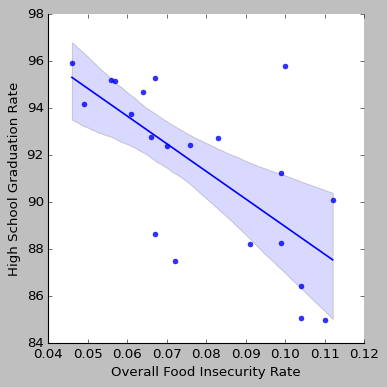

In [ ]:
sns.lmplot(x='Overall Food Insecurity Rate', y='High School Graduation Rate', data=SCN5MergeClean, fit_reg=True)
#The best interaction I found in my research came from these two charts. I think this is where I'll want to be trying to focus my research with the later district level stuff.

/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/core.py:1259: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='Ave. Commute (Min)', ylabel='High School Graduation Rate'>

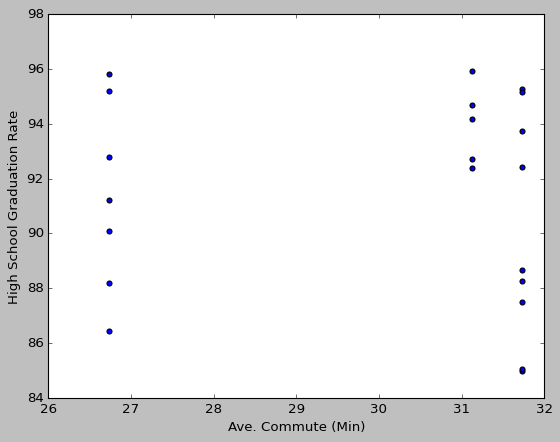

In [ ]:
SCN5MergeClean.plot(kind='scatter', y='High School Graduation Rate', x='Ave. Commute (Min)')
#Would love to find this dataset pulled away from the SCN classification. As it stands it's...not super useful.

In [ ]:
#SCN5MergeClean.plot(kind='scatter', y='High School Graduation Rate', x='Value')
#More and more small issues with the current livestock dataset. Not even going to fix this one as I would like to just find a different one at this point.

In [ ]:
CovidDataOnly = SCN5MergeClean[SCN5MergeClean['COVID-19 (U07.1)'] != 'NaN']
#Doing some wizardy to drop the missing variables to still examine what's going on.

In [ ]:
CovidDataOnly = CovidDataOnly[['COVID-19 (U07.1)', 'High School Graduation Rate']].astype(float)

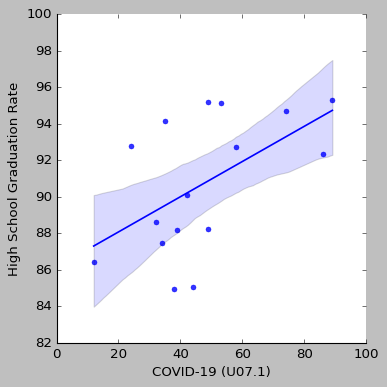

In [ ]:
sns.lmplot(x='COVID-19 (U07.1)', y='High School Graduation Rate', data=CovidDataOnly, fit_reg=True)

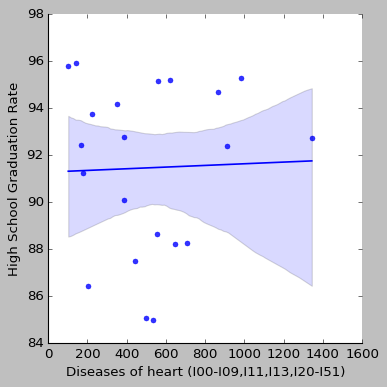

In [ ]:
sns.lmplot(x= 'Diseases of heart (I00-I09,I11,I13,I20-I51)', y='High School Graduation Rate', data=SCN5MergeClean, fit_reg=True)
#Both of these have the same issue that I'd like to work on a fix for. I have population data from earlier in the semester
#And a lot of the stats I'm finding are just the raw number, not the number per person
#What would the easiest way with python be to use those two numbers to generate a new variable that represents the ratio?
#So then I can use that to garner a more accurate display then just raw numerical data.

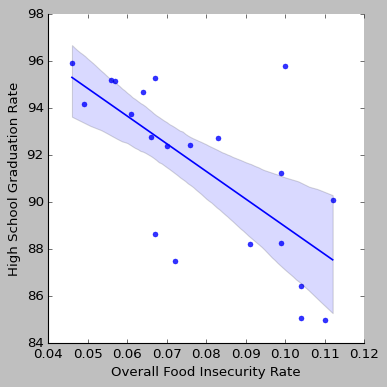

In [ ]:
sns.lmplot(x='Overall Food Insecurity Rate', y='High School Graduation Rate', data=SCN5MergeClean, fit_reg=True)

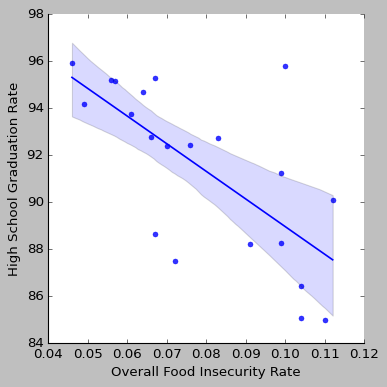

In [ ]:
sns.lmplot(x='Overall Food Insecurity Rate', y='High School Graduation Rate', data=SCN5MergeClean, fit_reg=True)

#PS6 Uploading and Merges

In [ ]:
#The most major dataset I'll be working with here comes directly from the DOE's State Report - this has a number of stats that all would be interesting to examine in relation to student success and failures
#as well as a number of different variables that could be used to track student success and student failure


In [58]:
#Nj Graduation rates by group.
#urllib.request.urlretrieve("https://docs.google.com/uc?id=1g168RZqCUj3aujXJP2CEssnLHBmYbDQw&export=download ", "GradRate.xlsv")
!wget -q -O GradRate.xlsv https://docs.google.com/uc?id=1g168RZqCUj3aujXJP2CEssnLHBmYbDQw&export=download

In [59]:
GradRateBasic=pd.read_excel('GradRate.xlsv')

In [60]:
GradRateBasic.columns

Index(['County Code', 'County Name', 'District Code', 'District Name',
       'School Code', 'School Name', 'Student Group', 'Graduation Rate',
       'Cohort Count', 'Graduated'],
      dtype='object')

In [61]:
GradRateNeeded=GradRateBasic[['County Name','District Code', 'District Name', 'School Name', 'Student Group', 'Graduation Rate']]

In [62]:
GradRateNeeded
#Narrowed down. Now we pull it to District level.

,County Name,District Code,District Name,School Name,Student Group,Graduation Rate
0,Union,4540.0,Roselle Public School District,Abraham Clark High School,American Indian or Alaska Native,N
1,Union,4540.0,Roselle Public School District,Abraham Clark High School,"Asian, Native Hawaiian, or Pacific Islander",*
2,Union,4540.0,Roselle Public School District,Abraham Clark High School,Black or African American,77.5
3,Union,4540.0,Roselle Public School District,Abraham Clark High School,Economically Disadvantaged Students,79.9
4,Union,4540.0,Roselle Public School District,Abraham Clark High School,English Learners,58.8
...,...,...,...,...,...,...
12491,Salem,5910.0,Woodstown-Pilesgrove Regional School District,Woodstown High School,Students with Disabilities,91.2
12492,Salem,5910.0,Woodstown-Pilesgrove Regional School District,Woodstown High School,Total,94.4
12493,Salem,5910.0,Woodstown-Pilesgrove Regional School District,Woodstown High School,Two or More Races,*
12494,Salem,5910.0,Woodstown-Pilesgrove Regional School District,Woodstown High School,White,94.4


In [63]:
DistrictGrad=GradRateNeeded[GradRateNeeded['School Name']=='District']

In [ ]:
DistrictGrad

,County Name,District Code,District Name,School Name,Student Group,Graduation Rate
1632,Atlantic,110.0,Atlantic City School District,District,American Indian or Alaska Native,N
1633,Atlantic,110.0,Atlantic City School District,District,"Asian, Native Hawaiian, or Pacific Islander",93.4
1634,Atlantic,110.0,Atlantic City School District,District,Black or African American,69.6
1635,Atlantic,110.0,Atlantic City School District,District,Economically Disadvantaged Students,75.9
1636,Atlantic,110.0,Atlantic City School District,District,English Learners,66.2
...,...,...,...,...,...,...
6948,Charter,8060.0,University Academy Charter High School,District,Students in Foster Care,N
6949,Charter,8060.0,University Academy Charter High School,District,Students with Disabilities,94.1
6950,Charter,8060.0,University Academy Charter High School,District,Total,95.2
6951,Charter,8060.0,University Academy Charter High School,District,Two or More Races,N


In [64]:
TotalGrad=DistrictGrad[DistrictGrad['Student Group']=='Total']

In [66]:
TotalGrad["Total Grad Rate"]=TotalGrad["Graduation Rate"]

In [65]:
TotalGrad=TotalGrad[['County Name','District Code', 'District Name', 'School Name', 'Student Group', 'Graduation Rate']]

In [ ]:
BlackGrad=DistrictGrad[DistrictGrad['Student Group']=='Black or African American']

In [ ]:
BlackGrad["Black Grad Rate"]=BlackGrad["Graduation Rate"]

<ipython-input-219-86356a26e6f9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BlackGrad["Black Grad Rate"]=BlackGrad["Graduation Rate"]


In [ ]:
BlackGrad=BlackGrad[['District Name','Black Grad Rate']]

In [ ]:
BlackGrad

,District Name,Black Grad Rate
1634,Atlantic City School District,69.6
1651,Atlantic County Vocational School District,96.9
1668,Buena Regional School District,81.0
1685,Egg Harbor Township School District,90.8
1702,Greater Egg Harbor Regional High School District,89.0
...,...,...
6870,Team Academy Charter School,95.1
6887,Chartertech High School For The Performing Arts,96.6
6904,Paterson Charter School For Science And Techno...,97.1
6921,Union County Teams Charter School-High School/...,96.0


In [ ]:
HispanicGrad=DistrictGrad[DistrictGrad['Student Group']=='Hispanic']

In [ ]:
HispanicGrad["Hispanic Grad Rate"]=HispanicGrad["Graduation Rate"]

<ipython-input-223-c3960f6f1ec2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HispanicGrad["Hispanic Grad Rate"]=HispanicGrad["Graduation Rate"]


In [ ]:
HispanicGrad=HispanicGrad[['District Name', 'Hispanic Grad Rate']]

In [ ]:
HispanicGrad

,District Name,Hispanic Grad Rate
1638,Atlantic City School District,70.8
1655,Atlantic County Vocational School District,96.2
1672,Buena Regional School District,82.5
1689,Egg Harbor Township School District,90.8
1706,Greater Egg Harbor Regional High School District,87.6
...,...,...
6874,Team Academy Charter School,100.0
6891,Chartertech High School For The Performing Arts,100.0
6908,Paterson Charter School For Science And Techno...,98.0
6925,Union County Teams Charter School-High School/...,100.0


In [ ]:
WhiteGrad=DistrictGrad[DistrictGrad['Student Group']=='White']

In [ ]:
WhiteGrad["White Grad Rate"]=WhiteGrad["Graduation Rate"]

<ipython-input-227-8cf172220719>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  WhiteGrad["White Grad Rate"]=WhiteGrad["Graduation Rate"]


In [ ]:
WhiteGrad=WhiteGrad[['District Name','White Grad Rate']]

In [ ]:
AsianGrad=DistrictGrad[DistrictGrad['Student Group']=='Asian, Native Hawaiian, or Pacific Islander']

In [ ]:
AsianGrad["Asian Grad Rate"]=AsianGrad["Graduation Rate"]

<ipython-input-230-95083397fc05>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  AsianGrad["Asian Grad Rate"]=AsianGrad["Graduation Rate"]


In [ ]:
AsianGrad=AsianGrad[['District Name','Asian Grad Rate']]

In [ ]:
AsianGrad

,District Name,Asian Grad Rate
1633,Atlantic City School District,93.4
1650,Atlantic County Vocational School District,100.0
1667,Buena Regional School District,*
1684,Egg Harbor Township School District,98.0
1701,Greater Egg Harbor Regional High School District,98.6
...,...,...
6869,Team Academy Charter School,*
6886,Chartertech High School For The Performing Arts,*
6903,Paterson Charter School For Science And Techno...,N
6920,Union County Teams Charter School-High School/...,*


In [ ]:
NonEnglishGrad=DistrictGrad[DistrictGrad['Student Group']=='English Learners']

In [ ]:
NonEnglishGrad["English Learner Grad Rate"]=NonEnglishGrad["Graduation Rate"]

<ipython-input-234-44e557156f61>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NonEnglishGrad["English Learner Grad Rate"]=NonEnglishGrad["Graduation Rate"]


In [ ]:
NonEnglishGrad=NonEnglishGrad[['District Name', 'English Learner Grad Rate']]

In [ ]:
NonEnglishGrad

,District Name,English Learner Grad Rate
1636,Atlantic City School District,66.2
1653,Atlantic County Vocational School District,N
1670,Buena Regional School District,*
1687,Egg Harbor Township School District,97.0
1704,Greater Egg Harbor Regional High School District,94.4
...,...,...
6872,Team Academy Charter School,*
6889,Chartertech High School For The Performing Arts,*
6906,Paterson Charter School For Science And Techno...,*
6923,Union County Teams Charter School-High School/...,N


In [ ]:
PovertyGrad=DistrictGrad[DistrictGrad['Student Group']=='Economically Disadvantaged Students']

In [ ]:
PovertyGrad["Poverty Grad Rate"]=PovertyGrad["Graduation Rate"]

<ipython-input-238-65688e168af2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PovertyGrad["Poverty Grad Rate"]=PovertyGrad["Graduation Rate"]


In [ ]:
PovertyGrad=PovertyGrad[['District Name', 'Poverty Grad Rate']]

In [ ]:
PovertyGrad

,District Name,Poverty Grad Rate
1635,Atlantic City School District,75.9
1652,Atlantic County Vocational School District,96.5
1669,Buena Regional School District,76.9
1686,Egg Harbor Township School District,90.5
1703,Greater Egg Harbor Regional High School District,85.4
...,...,...
6871,Team Academy Charter School,95.4
6888,Chartertech High School For The Performing Arts,93.7
6905,Paterson Charter School For Science And Techno...,97.5
6922,Union County Teams Charter School-High School/...,97.1


In [ ]:
BlackHispanicGrad = pd.merge(BlackGrad, HispanicGrad, how='outer', on=['District Name'], indicator=False)

In [ ]:
BlackHispanicWhiteGrad = pd.merge(BlackHispanicGrad, WhiteGrad, how='outer', on=['District Name'], indicator=False)

In [ ]:
BlackHispanicWhiteAsianGrad = pd.merge(BlackHispanicWhiteGrad, AsianGrad, how='outer', on=['District Name'], indicator=False)

In [ ]:
RaceLearnerGrad = pd.merge(BlackHispanicWhiteAsianGrad, NonEnglishGrad, how='outer', on=['District Name'], indicator=False)

In [ ]:
RacePovLearnerGrad = pd.merge(RaceLearnerGrad, PovertyGrad, how='outer', on=['District Name'], indicator=False)

In [ ]:
TotalGradRate = pd.merge(RacePovLearnerGrad, TotalGrad, how='outer', on=['District Name'], indicator=False)
#These all merged correctly - I preformed the indicator True at each stage, then removed it and added it to the next one to do a manual pass on each without having to remove the _merge each time.

In [ ]:
TotalGradRate

,District Name,Black Grad Rate,Hispanic Grad Rate,White Grad Rate,Asian Grad Rate,English Learner Grad Rate,Poverty Grad Rate,County Name,District Code,School Name,Student Group,Graduation Rate
0,Atlantic City School District,69.6,70.8,89.8,93.4,66.2,75.9,Atlantic,110.0,District,Total,76.6
1,Atlantic County Vocational School District,96.9,96.2,97.7,100.0,N,96.5,Atlantic,120.0,District,Total,97.2
2,Buena Regional School District,81.0,82.5,87.0,*,*,76.9,Atlantic,590.0,District,Total,85.2
3,Egg Harbor Township School District,90.8,90.8,92.7,98.0,97.0,90.5,Atlantic,1310.0,District,Total,92.9
4,Greater Egg Harbor Regional High School District,89.0,87.6,89.8,98.6,94.4,85.4,Atlantic,1790.0,District,Total,89.4
...,...,...,...,...,...,...,...,...,...,...,...,...
308,Team Academy Charter School,95.1,100.0,*,*,*,95.4,Charter,7325.0,District,Total,95.5
309,Chartertech High School For The Performing Arts,96.6,100.0,82.8,*,*,93.7,Charter,7410.0,District,Total,92.6
310,Paterson Charter School For Science And Techno...,97.1,98.0,*,N,*,97.5,Charter,7503.0,District,Total,97.7
311,Union County Teams Charter School-High School/...,96.0,100.0,N,*,N,97.1,Charter,8010.0,District,Total,97.2


In [ ]:
TotalGradRate["DistrictName"]=TotalGradRate["District Name"]

In [ ]:
#urllib.request.urlretrieve("https://github.com/peguescj/data-management/raw/main/DISTRICT%20PERFORMANCE%20REPORT%202122.xlsx  ", "DOE.xlsx")
!wget -q -O DOE.xlsx https://github.com/peguescj/data-management/raw/main/DISTRICT%20PERFORMANCE%20REPORT%202122.xlsx
#The major DOE report. I'll be pulling a number of variables out, though all of them are on seperate sheets.
#Being honest, I found so much data within this dataset that I wanted to focus my draft on just getting this together, and seeing which variables would be most interesting to work with.
#I'd appreciate your feedback on which ones that could be cut, or if there are some external datasets you think would serve this well.
#I largely ended up moving away from the greenspace concept, with the depth of data here, and the difficulty of finding it at District level.
#For final draft, what it seems like I'll be doing is revising the PS5 section with some greenspace data, to lower to 4 counties(One in each quartile of student success), and then run the below charts again with
#That added limit in mind.

#Some major variables I'd love to explore more in a future report that I already trimmed- absentee rates, broken up by student groups, home languages, Enrollment trends, enrollment and success in
#specific major required courses(English, Math, Science), graduation trends over time, as well as the "Narratives" that each school provides the state, which I actually generated a profile for
#below just to get the wordgraph.

#The variables I've included off the bat are participation in major exams, enrollment in arts, dropout rates, the % of students who pursue higher ed, incidents of violence, teacher and admin experience
#admin and teacher demographics, including race, years spent teaching, years spent in that district, and highest degree earned by the teachers proportionally.

#NOTE FOR MERGING: The DOE datasets report on each Charter school district as well, which are not reported in the DOE graduation report data. There is a graduation statistic within the DOE set, but I
#wanted to explore public schools specifically, as well as the student group trends, which are not reported by Charters.
#With Charters, there's 669 school districts - with public only, it's 313(Many of the datasets will have 314 - this represents public school reporting+state level).
#That being said, there is also some discrepency within each variable set of which schools report or do not. Will discuss in office hours how to best handle comparisons.

In [ ]:
!file DOE.xlsx

DOE.xlsx: Microsoft Excel 2007+


In [ ]:
SAT=pd.read_excel('DOE.xlsx',
                  sheet_name='PSAT-SAT-ACTParticipation')

In [ ]:
SAT
#SAT, ACT, PSAT participation rates by schools.

,CountyCode,CountyName,DistrictCode,DistrictName,SAT,ACT,PSAT,STATE_SAT,STATE_ACT,STATE_PSAT
0,01,Atlantic,0110,Atlantic City School District,37.5,1.3,80.5,60.8,8.8,77.7
1,01,Atlantic,0120,Atlantic County Vocational School District,40.9,1.3,94.3,60.8,8.8,77.7
2,01,Atlantic,0590,Buena Regional School District,39.2,1.7,45.2,60.8,8.8,77.7
3,01,Atlantic,1310,Egg Harbor Township School District,55.4,0.9,92.1,60.8,8.8,77.7
4,01,Atlantic,1790,Greater Egg Harbor Regional High School District,78.2,2.0,100.0,60.8,8.8,77.7
...,...,...,...,...,...,...,...,...,...,...
313,80,Charters,7503,Paterson Charter School for Science and Techno...,67.4,34.7,0.0,60.8,8.8,77.7
314,80,Charters,7892,College Achieve Paterson Charter School,N,N,99.1,60.8,8.8,77.7
315,80,Charters,8010,Union County TEAMS Charter School-High School/...,97.1,8.8,55.7,60.8,8.8,77.7
316,80,Charters,8060,University Academy Charter High School,64.0,0.0,91.4,60.8,8.8,77.7


In [ ]:
SAT=SAT[['DistrictCode','DistrictName','SAT','ACT','PSAT']]

In [ ]:
SATRate = pd.merge(TotalGradRate, SAT, how='outer', on=['DistrictName'], indicator=False)

In [ ]:
SATRate
#Turned the indicator off - Charter schools and tech schools failed to merge onto the grad rate doc, as predicted.

,District Name,Black Grad Rate,Hispanic Grad Rate,White Grad Rate,Asian Grad Rate,English Learner Grad Rate,Poverty Grad Rate,County Name,District Code,School Name,Student Group,Graduation Rate,DistrictName,DistrictCode,SAT,ACT,PSAT,_merge
0,Atlantic City School District,69.6,70.8,89.8,93.4,66.2,75.9,Atlantic,110.0,District,Total,76.6,Atlantic City School District,0110,37.5,1.3,80.5,both
1,Atlantic County Vocational School District,96.9,96.2,97.7,100.0,N,96.5,Atlantic,120.0,District,Total,97.2,Atlantic County Vocational School District,0120,40.9,1.3,94.3,both
2,Buena Regional School District,81.0,82.5,87.0,*,*,76.9,Atlantic,590.0,District,Total,85.2,Buena Regional School District,0590,39.2,1.7,45.2,both
3,Egg Harbor Township School District,90.8,90.8,92.7,98.0,97.0,90.5,Atlantic,1310.0,District,Total,92.9,Egg Harbor Township School District,1310,55.4,0.9,92.1,both
4,Greater Egg Harbor Regional High School District,89.0,87.6,89.8,98.6,94.4,85.4,Atlantic,1790.0,District,Total,89.4,Greater Egg Harbor Regional High School District,1790,78.2,2.0,100.0,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
340,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Chartertech High School for the Performing Arts,7410,100.0,82.7,85.8,right_only
341,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Paterson Charter School for Science and Techno...,7503,67.4,34.7,0.0,right_only
342,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,College Achieve Paterson Charter School,7892,N,N,99.1,right_only
343,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Union County TEAMS Charter School-High School/...,8010,97.1,8.8,55.7,right_only


In [ ]:
DramaEnroll=pd.read_excel('DOE.xlsx',
                  sheet_name='VisualAndPerformingArts')

In [ ]:
DramaEnroll
#The only one of the enrollment stats that came in % form innately. I figured it also was the most interesting to work with, as it would denote a school with the resources
#to focus on preforming art and drama programs, and not just the state essentials.

,CountyCode,CountyName,DistrictCode,DistrictName,Grades,AnyVisualPerfArt_District,AnyVisualPerfArt_State,Music_District,Music_State,Dance_District,Dance_State,Drama_District,Drama_State,VisArts_District,VisArts_State
0,01,Atlantic,0010,Absecon Public Schools District,Grades 6-8,99.3,88.8,0,59.4,0,3.3,0,7.1,99.3,71.0
1,01,Atlantic,0110,Atlantic City School District,Grades 6-8,97.5,88.8,95.0,59.4,0,3.3,0,7.1,96.7,71.0
2,01,Atlantic,0110,Atlantic City School District,Grades 9-12,40.4,49.8,10.6,15.1,2.2,2.4,1.7,3.5,29.1,34.0
3,01,Atlantic,0120,Atlantic County Vocational School District,Grades 9-12,23.3,49.8,6.5,15.1,1.7,2.4,1.7,3.5,15.5,34.0
4,01,Atlantic,0570,Brigantine Public School District,Grades 6-8,99.2,88.8,47.1,59.4,0,3.3,0,7.1,98.3,71.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
839,80,Charters,8060,University Academy Charter High School,Grades 9-12,40.8,49.8,20.5,15.1,0,2.4,0,3.5,26.3,34.0
840,80,Charters,8065,University Heights Charter School,Grades 6-8,94.8,88.8,34.2,59.4,60.6,3.3,0,7.1,92.9,71.0
841,80,Charters,8140,The Village Charter School,Grades 6-8,100.0,88.8,100.0,59.4,0,3.3,0,7.1,100.0,71.0
842,State,State,State,State,Grades 6-8,NaN,88.8,NaN,59.4,NaN,3.3,NaN,7.1,NaN,71.0


In [ ]:
DramaEnroll.columns

Index(['CountyCode', 'CountyName', 'DistrictCode', 'DistrictName', 'Grades',
       'AnyVisualPerfArt_District', 'AnyVisualPerfArt_State', 'Music_District',
       'Music_State', 'Dance_District', 'Dance_State', 'Drama_District',
       'Drama_State', 'VisArts_District', 'VisArts_State'],
      dtype='object')

In [ ]:
DramaEnroll=DramaEnroll[DramaEnroll['Grades']=='Grades 9-12']

KeyError: ignored

In [ ]:
DramaEnroll=DramaEnroll[['DistrictName','AnyVisualPerfArt_District','Music_District','Dance_District','Drama_District','VisArts_District']]

In [ ]:
DramaEnroll
#This one I've looked multiple times why it comes out to 321 - it seems like a very few amount of charter schools reported on this?

,DistrictName,AnyVisualPerfArt_District,Music_District,Dance_District,Drama_District,VisArts_District
2,Atlantic City School District,40.4,10.6,2.2,1.7,29.1
3,Atlantic County Vocational School District,23.3,6.5,1.7,1.7,15.5
6,Buena Regional School District,69.0,6.4,9.1,4.8,56.1
9,Egg Harbor Township School District,38.2,10.7,1.9,1.4,26.1
13,Greater Egg Harbor Regional High School District,44.5,12.0,6.6,4.1,27.3
...,...,...,...,...,...,...
832,College Achieve Paterson Charter School,100.0,52.5,0,0,48.3
834,Achievers Early College Prep Charter School,76.1,0,0,0,76.1
837,Union County TEAMS Charter School-High School/...,45.3,44.6,0,0,0.7
839,University Academy Charter High School,40.8,20.5,0,0,26.3


In [ ]:
DramaRate = pd.merge(SATRate, DramaEnroll, how='outer', on=['DistrictName'], indicator=False)

In [ ]:
Dropout=pd.read_excel('DOE.xlsx',
                  sheet_name='DropoutRateTrends')

In [ ]:
Dropout=Dropout[['DistrictCode','DistrictName','Dropout_District']]

In [ ]:
Dropout
#The dropout rate by each district.

,DistrictCode,DistrictName,Dropout_District
0,0110,Atlantic City School District,4.4
1,0120,Atlantic County Vocational School District,0.1
2,0590,Buena Regional School District,2.7
3,1310,Egg Harbor Township School District,0.9
4,1790,Greater Egg Harbor Regional High School District,1.6
...,...,...,...
309,7410,Chartertech High School for the Performing Arts,0.3
310,7503,Paterson Charter School for Science and Techno...,1.4
311,8010,Union County TEAMS Charter School-High School/...,0.0
312,8060,University Academy Charter High School,1.4


In [ ]:
DropRate = pd.merge(DramaRate, Dropout, how='outer', on=['DistrictName'], indicator=False)

In [ ]:
College=pd.read_excel('DOE.xlsx',
                  sheet_name='PostSecondaryEnrRateSummary')

In [ ]:
College
#The % of students from each district that enrolled into further studies.

,CountyCode,CountyName,DistrictCode,DistrictName,ClassYear,PercentEnrolledIn2YearInstitution,PercentEnrolledIn4YearInstitution,PercentEnrolledInAnyInstitution
0,01,Atlantic,0110,Atlantic City School District,2019,23.2,40.0,63.5
1,01,Atlantic,0110,Atlantic City School District,2020,21.3,35.5,56.9
2,01,Atlantic,0110,Atlantic City School District,2021,16.4,37.4,53.7
3,01,Atlantic,0120,Atlantic County Vocational School District,2019,35.1,34.6,69.7
4,01,Atlantic,0120,Atlantic County Vocational School District,2020,37.4,33.2,70.7
...,...,...,...,...,...,...,...,...
937,80,Charters,8060,University Academy Charter High School,2020,21.4,49.0,70.4
938,80,Charters,8060,University Academy Charter High School,2021,11.2,49.0,60.2
939,State,State,State,State,2019,23.4,52.9,76.3
940,State,State,State,State,2020,21.8,52.0,73.7


In [ ]:
College2021=College[College['ClassYear']==2021]
College2021

,CountyCode,CountyName,DistrictCode,DistrictName,ClassYear,PercentEnrolledIn2YearInstitution,PercentEnrolledIn4YearInstitution,PercentEnrolledInAnyInstitution
2,01,Atlantic,0110,Atlantic City School District,2021,16.4,37.4,53.7
5,01,Atlantic,0120,Atlantic County Vocational School District,2021,37.0,35.0,72.0
8,01,Atlantic,0590,Buena Regional School District,2021,21.1,32.5,53.7
11,01,Atlantic,1310,Egg Harbor Township School District,2021,23.8,49.8,73.6
14,01,Atlantic,1790,Greater Egg Harbor Regional High School District,2021,22.4,44.0,66.4
...,...,...,...,...,...,...,...,...
929,80,Charters,7410,Chartertech High School for the Performing Arts,2021,15.5,29.8,45.2
932,80,Charters,7503,Paterson Charter School for Science and Techno...,2021,12.9,54.8,67.7
935,80,Charters,8010,Union County TEAMS Charter School-High School/...,2021,23.1,48.7,71.8
938,80,Charters,8060,University Academy Charter High School,2021,11.2,49.0,60.2


In [ ]:
College2021Clean=College2021[['DistrictCode','DistrictName','PercentEnrolledIn2YearInstitution'	,'PercentEnrolledIn4YearInstitution'	,'PercentEnrolledInAnyInstitution']]

In [ ]:
College2021Clean

,DistrictCode,DistrictName,PercentEnrolledIn2YearInstitution,PercentEnrolledIn4YearInstitution,PercentEnrolledInAnyInstitution
2,0110,Atlantic City School District,16.4,37.4,53.7
5,0120,Atlantic County Vocational School District,37.0,35.0,72.0
8,0590,Buena Regional School District,21.1,32.5,53.7
11,1310,Egg Harbor Township School District,23.8,49.8,73.6
14,1790,Greater Egg Harbor Regional High School District,22.4,44.0,66.4
...,...,...,...,...,...
929,7410,Chartertech High School for the Performing Arts,15.5,29.8,45.2
932,7503,Paterson Charter School for Science and Techno...,12.9,54.8,67.7
935,8010,Union County TEAMS Charter School-High School/...,23.1,48.7,71.8
938,8060,University Academy Charter High School,11.2,49.0,60.2


In [ ]:
CollegeRate = pd.merge(DropRate, College2021Clean, how='outer', on=['DistrictName'], indicator=False)

In [ ]:
VVHIB=pd.read_excel('DOE.xlsx',
          sheet_name='ViolenceVandalismHIBSubstanceOf')

In [ ]:
VVHIB=VVHIB[['Incidents Per 100 Students Enrolled','DistrictCode','DistrictName']]

In [ ]:
VVHIB
#The number of incidents of violence per 100 students enrolled at each school district. Harassment, intimidation, bullying, drug use, and weapons found at school are all counted as incidents of violence.

,Incidents Per 100 Students Enrolled,DistrictCode,DistrictName
0,1.51,0010,Absecon Public Schools District
1,4.71,0110,Atlantic City School District
2,2.10,0120,Atlantic County Vocational School District
3,7.89,0125,Atlantic County Special Services School District
4,0.25,0570,Brigantine Public School District
...,...,...,...
665,0.00,8050,Unity Charter School
666,6.53,8060,University Academy Charter High School
667,N,8065,University Heights Charter School
668,1.96,8140,The Village Charter School


In [ ]:
VVHIBRate = pd.merge(CollegeRate, VVHIB, how='outer', on=['DistrictName'], indicator=False)

<ipython-input-313-3ca0f78224c3>:1: FutureWarning: Passing 'suffixes' which cause duplicate columns {'DistrictCode_x'} in the result is deprecated and will raise a MergeError in a future version.
  VVHIBRate = pd.merge(CollegeRate, VVHIB, how='outer', on=['DistrictName'], indicator=False)


In [ ]:
TeacherExperience=pd.read_excel('DOE.xlsx',
          sheet_name='TeachersExperience')

In [ ]:
TeacherExperience

,CountyCode,CountyName,DistrictCode,DistrictName,TeacherCount_District,TeacherCount_State,TeacherAvgYearsExp_District,TeacherAvgYearsExp_State,TeacherAvgYearsExpInDistrict_District,TeacherAvgYearsExpInDistrict_State,TeacherInDistrict4YearsOrMore_District,TeacherInDistrict4YearsOrMore_State,NumberOfOutOfFieldTeachers,NumberOfOutOfFieldTeachers_State
0,01,Atlantic,0010,Absecon Public Schools District,87,118773,12.9,12.5,10.7,11.3,64.4,76.0,1.0,2937
1,01,Atlantic,0110,Atlantic City School District,643,118773,14.0,12.5,13.2,11.3,78.0,76.0,8.0,2937
2,01,Atlantic,0120,Atlantic County Vocational School District,142,118773,8.5,12.5,8.3,11.3,76.1,76.0,5.0,2937
3,01,Atlantic,0125,Atlantic County Special Services School District,45,118773,16.9,12.5,15.3,11.3,91.1,76.0,0.0,2937
4,01,Atlantic,0570,Brigantine Public School District,63,118773,17.6,12.5,16.6,11.3,79.4,76.0,0.0,2937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
665,80,Charters,8050,Unity Charter School,28,118773,8.8,12.5,4.5,11.3,48.1,76.0,2.0,2937
666,80,Charters,8060,University Academy Charter High School,35,118773,8.2,12.5,5.3,11.3,40.0,76.0,1.0,2937
667,80,Charters,8065,University Heights Charter School,60,118773,8.3,12.5,2.3,11.3,16.7,76.0,2.0,2937
668,80,Charters,8140,The Village Charter School,33,118773,11.0,12.5,4.4,11.3,60.6,76.0,4.0,2937


In [ ]:
TeacherExperience=TeacherExperience[['DistrictCode', 'DistrictName','TeacherAvgYearsExp_District','TeacherAvgYearsExpInDistrict_District', 'TeacherInDistrict4YearsOrMore_District']]

In [ ]:
TADemo=pd.read_excel('DOE.xlsx',
          sheet_name='TeachersAdminsDemographics')

In [ ]:
TADemo==TADemo[TADemo]

,CountyCode,CountyName,DistrictCode,DistrictName,Teachers/Admins,Female,Male,Non-Binary/Undesignated Gender,White,Hispanic,Black or African American,Asian,American Indian or Alaska Native,Native Hawaiian or Pacific Islander,Two or More Races
0,01,Atlantic,0010,Absecon Public Schools District,Students,50,50,≤1%,49.5,25.8,13.9,6.0,0.0,0.0,4.8
1,01,Atlantic,0010,Absecon Public Schools District,Teachers,80-85%,15-20%,≤5%,96.6,1.1,1.1,0.0,0.0,0.0,1.1
2,01,Atlantic,0010,Absecon Public Schools District,Admins,*,*,*,100.0,0.0,0.0,0.0,0.0,0.0,0.0
3,01,Atlantic,0110,Atlantic City School District,Students,48,52,≤1%,3.6,44.8,33.6,15.8,0.0,0.5,1.8
4,01,Atlantic,0110,Atlantic City School District,Teachers,71,29,≤1%,59.6,10.3,27.2,1.7,0.0,0.2,1.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2005,80,Charters,8140,The Village Charter School,Teachers,80-90%,10-20%,≤10%,75.8,3.0,21.2,0.0,0.0,0.0,0.0
2006,80,Charters,8140,The Village Charter School,Admins,*,*,*,50.0,0.0,50.0,0.0,0.0,0.0,0.0
2007,State,State,State,State,Students,48,52,≤1%,40.1,32.1,14.6,10.1,0.2,0.2,2.7
2008,State,State,State,State,Teachers,77,23,≤1%,82.6,8.1,6.5,2.3,0.1,0.2,0.2


In [ ]:
TADemo.columns

Index(['CountyCode', 'CountyName', 'DistrictCode', 'DistrictName',
       'Teachers/Admins', 'Female', 'Male', 'Non-Binary/Undesignated Gender',
       'White', 'Hispanic', 'Black or African American', 'Asian',
       'American Indian or Alaska Native',
       'Native Hawaiian or Pacific Islander', 'Two or More Races'],
      dtype='object')

In [ ]:
TDemo=TADemo[TADemo['Teachers/Admins']=='Teachers']

In [ ]:
DemoRate = pd.merge(VVHIBRate, TDemo, how='outer', on=['DistrictName'], indicator=False)

In [ ]:
TAEducation=pd.read_excel('DOE.xlsx',
          sheet_name='TeachersAdminsLevelOfEducation')

In [ ]:
TAEducation

,CountyCode,CountyName,DistrictCode,DistrictName,Teachers/Admins,Bachelors,Masters,Doctoral
0,01,Atlantic,0010,Absecon Public Schools District,Admin,NaN,83.3,16.7
1,01,Atlantic,0010,Absecon Public Schools District,Teachers,63.2,35.6,1.1
2,01,Atlantic,0110,Atlantic City School District,Admin,NaN,87.9,12.1
3,01,Atlantic,0110,Atlantic City School District,Teachers,53.7,44.6,1.7
4,01,Atlantic,0120,Atlantic County Vocational School District,Admin,NaN,85.7,14.3
...,...,...,...,...,...,...,...,...
1335,80,Charters,8065,University Heights Charter School,Teachers,65.0,35.0,0
1336,80,Charters,8140,The Village Charter School,Admin,NaN,100.0,0
1337,80,Charters,8140,The Village Charter School,Teachers,78.8,21.2,0
1338,State,State,State,State,Admin,NaN,89.9,10.1


In [ ]:
#Decided to hold off on the Teacher experience and time in district for now.

In [ ]:
ProfileReport (DemoRate, title='Exploratory Variables')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

ValueError: ignored

#Charts

In [ ]:
#Black Grad Rate by Black Teacher Demo

In [ ]:
#Hispanic Grad Rate by Hispanic Teacher Demo

In [ ]:
#White Grad Rate by White Teacher Demo

In [ ]:
#Total Grad Rate by each of the three above demos to see if they hold up just for the ethnicity

In [ ]:
#Food insecurity by grad rate

In [ ]:
#Food insecurity by SAT

In [ ]:
#food insecurity by preforming arts

In [ ]:
Narrative=pd.read_excel('DOE.xlsx',
          sheet_name='Narrative')

In [ ]:
Narrative.columns

Index(['CountyCode', 'CountyName', 'DistrictCode', 'DistrictName',
       'Highlight1', 'Highlight2', 'Highlight3', 'Mission', 'Awards',
       'Courses', 'Sports', 'SportsNarrative', 'Clubs', 'Programs', 'Staff',
       'Postsecondary', 'Supports', 'Health', 'Parent', 'ClimateSurveyUsed',
       'WholsSurveyed', 'ClimateNarrative', 'Facilities', 'SchoolSafety',
       'TechnologySTEM', 'EarlyChildhood', 'LearningDuringCOVID-19:',
       'OtherInformation'],
      dtype='object')

In [ ]:
Narrative=Narrative[['Mission']]
#Making a simple wordcloud with the Profile feature.

In [ ]:
ProfileReport (Narrative, title='Narrative Wordcloud')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]